# Movie Result Aggregation
- Prepare DFs
- Plots for single models
- Comparisons

In [1]:
import polars as pl
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
from pathlib import Path

In [2]:
movie_dirs = {
    "ExE": Path('../evaluation/pixa_v2/movies'),
    "RAF-DB": Path('../evaluation/raf/movies')
}

In [3]:
def quick_df_eval(df_dict):
    for name, df in df_dict.items():
        print(f'Model name: {name}')
        print(f'df shape: {df.shape}')
        print(f'column names: {(", ").join(df.columns)}')
        print(f'First 5 rows of data:')
        print(df.head())

In [4]:
def concat_all_movies(movie_dir, save_name=None):
    movie_files = list(movie_dir.glob("*.parquet"))
    
    # Read and concat all movies
    all_movies = pl.concat([
        pl.read_parquet(f) for f in movie_files 
        if f.name != "combined_results.parquet"  # Skip if it exists
    ])

    all_movies = all_movies.with_columns([
        pl.when(pl.col('relative_face_area') < 0.05).then(pl.lit('tiny'))
        .when(pl.col('relative_face_area') < 0.15).then(pl.lit('small'))
        .when(pl.col('relative_face_area') < 0.30).then(pl.lit('medium'))
        .otherwise(pl.lit('large'))
        .alias('face_size_category')
    ])

    if save_name:
        parent_dir = movie_dir.parent
        out_path = parent_dir / save_name
        all_movies.write_parquet(out_path)
    
    return all_movies

In [5]:
def model_summary(df):
    summary = df.select([
        pl.col('face_area').mean().alias('face_area_mean'),
        pl.col('face_area').median().alias('face_area_median'),
        pl.col('face_area').std().alias('face_area_std'),
        pl.col('face_area').min().alias('face_area_min'),
        pl.col('face_area').max().alias('face_area_max'),
        
        pl.col('relative_face_area').mean().alias('rel_face_area_mean'),
        pl.col('relative_face_area').median().alias('rel_face_area_median'),
        
        pl.col('confidence').mean().alias('confidence_mean'),
        pl.col('confidence').median().alias('confidence_median'),
        pl.col('confidence').std().alias('confidence_std'),
        pl.col('confidence').min().alias('confidence_min'),
        
        pl.len().alias('total_frames')
    ])

    return summary    

In [6]:
def movie_summary(df):
    movie_summary = df.group_by('movie').agg([
        pl.len().alias('frames_analyzed'),
        pl.col('face_area').mean().alias('avg_face_area'),
        pl.col('relative_face_area').mean().alias('avg_rel_face_area'),
        pl.col('confidence').mean().alias('avg_confidence'),
        pl.col('confidence').min().alias('min_confidence'),
        pl.col('timestamp_sec').max().alias('duration_sec'),
        (pl.col('timestamp_sec').max() / 60).round(1).alias('duration_min'),
        pl.col('emotion').mode().first().alias('most_common'),
        pl.col("emotion").str.count_matches("angry").sum().alias("angry_count"),
        pl.col("emotion").str.count_matches("surprise").sum().alias("surprise_count"),
        pl.col("emotion").str.count_matches("happy").sum().alias("happy_count"),
        pl.col("emotion").str.count_matches("fear").sum().alias("fear_count"),
        pl.col("emotion").str.count_matches("sad").sum().alias("sad_count"),

    
    ]).sort('movie')
    return movie_summary

In [7]:
def emotion_summary(df):
    emotion_confidence = df.group_by('emotion').agg([
        pl.len().alias('count'),
        pl.col('confidence').mean().alias('avg_confidence'),
        pl.col('confidence').median().alias('median_confidence'),
        pl.col('confidence').quantile(0.25).alias('q25_confidence'),
        pl.col('confidence').quantile(0.75).alias('q75_confidence'),
        pl.col('confidence').mean().alias('avg_conf'),
        (pl.len() / df.height * 100).alias('percent')

    ]).sort('avg_confidence', descending=True)
    
    return emotion_confidence

In [8]:
def movie_emotion_summary(df, save_dir=None):
    summary = df.group_by(['movie','emotion']).agg([
        pl.len().alias("count"),
        pl.col('confidence').mean().alias('avg_conf'),
        pl.col('relative_face_area').mean().alias('avg_rel_face_area')
    ]).pivot(
        index='movie',
        on='emotion',
        values=None
        # values='count'
    ).fill_null(0)

    emotion_count_cols = ["count_fear", "count_happy", "count_angry", "count_surprise", "count_sad"]
    summary = summary.with_columns([
        pl.sum_horizontal(emotion_count_cols).alias("total_faces"),
    ])

    summary = summary.with_columns([
        (pl.col("count_angry") / pl.col("total_faces") * 100).alias("angry_pct"),
        (pl.col("count_fear") / pl.col("total_faces") * 100).alias("fear_pct"),
        (pl.col("count_happy") / pl.col("total_faces") * 100).alias("happy_pct"),
        (pl.col("count_sad") / pl.col("total_faces") * 100).alias("sad_pct"),
        (pl.col("count_surprise") / pl.col("total_faces") * 100).alias("surprise_pct"),
    ])

    summary = summary.with_columns([
        pl.max_horizontal([
            "angry_pct", "fear_pct", "happy_pct", "sad_pct", "surprise_pct"
        ]).alias("max_pct"),
    ])

    summary = summary.with_columns([
        pl.when(pl.col("angry_pct") == pl.col("max_pct")).then(pl.lit("angry"))
            .when(pl.col("fear_pct") == pl.col("max_pct")).then(pl.lit("fear"))
            .when(pl.col("happy_pct") == pl.col("max_pct")).then(pl.lit("happy"))
            .when(pl.col("sad_pct") == pl.col("max_pct")).then(pl.lit("sad"))
            .when(pl.col("surprise_pct") == pl.col("max_pct")).then(pl.lit("surprise"))
            .alias("dominant_emotion")
        ])
            
    if save_dir:
        parent_dir = save_dir.parent
        out_path = parent_dir / 'movie_emotion_summary.parquet'
        summary.write_parquet(out_path)
    
    return summary


## Data Aggregation
- Concat all movie file
- Create summary/agg data at multiple level:
    - model 
    - movie
    - emotion
    - movie and emotion

In [9]:
movie_dirs

{'ExE': PosixPath('../evaluation/pixa_v2/movies'),
 'RAF-DB': PosixPath('../evaluation/raf/movies')}

In [10]:
# concat movie files
movie_dfs = {}
for model, movies in movie_dirs.items():
    print(model)
    print(movies)
    movie_dfs[model] = concat_all_movies(movies, save_name="all_movies.parquet")

ExE
../evaluation/pixa_v2/movies
RAF-DB
../evaluation/raf/movies


In [11]:
quick_df_eval(movie_dfs)

Model name: ExE
df shape: (47252, 8)
column names: movie, frame_idx, timestamp_sec, face_area, relative_face_area, emotion, confidence, face_size_category
First 5 rows of data:
shape: (5, 8)
┌────────┬───────────┬──────────────┬───────────┬─────────────┬─────────┬────────────┬─────────────┐
│ movie  ┆ frame_idx ┆ timestamp_se ┆ face_area ┆ relative_fa ┆ emotion ┆ confidence ┆ face_size_c │
│ ---    ┆ ---       ┆ c            ┆ ---       ┆ ce_area     ┆ ---     ┆ ---        ┆ ategory     │
│ str    ┆ i64       ┆ ---          ┆ i64       ┆ ---         ┆ str     ┆ f64        ┆ ---         │
│        ┆           ┆ f64          ┆           ┆ f64         ┆         ┆            ┆ str         │
╞════════╪═══════════╪══════════════╪═══════════╪═════════════╪═════════╪════════════╪═════════════╡
│ domino ┆ 700       ┆ 29.195865    ┆ 11881     ┆ 0.046879    ┆ happy   ┆ 0.921258   ┆ tiny        │
│ domino ┆ 1500      ┆ 62.562568    ┆ 114244    ┆ 0.450773    ┆ fear    ┆ 0.733034   ┆ large       │
│

In [12]:
model_summary_dfs = {}
for model, df in movie_dfs.items():
    model_summary_dfs[model] = model_summary(df)

In [13]:
quick_df_eval(model_summary_dfs)

Model name: ExE
df shape: (1, 12)
column names: face_area_mean, face_area_median, face_area_std, face_area_min, face_area_max, rel_face_area_mean, rel_face_area_median, confidence_mean, confidence_median, confidence_std, confidence_min, total_frames
First 5 rows of data:
shape: (1, 12)
┌───────────┬───────────┬───────────┬───────────┬───┬───────────┬───────────┬───────────┬──────────┐
│ face_area ┆ face_area ┆ face_area ┆ face_area ┆ … ┆ confidenc ┆ confidenc ┆ confidenc ┆ total_fr │
│ _mean     ┆ _median   ┆ _std      ┆ _min      ┆   ┆ e_median  ┆ e_std     ┆ e_min     ┆ ames     │
│ ---       ┆ ---       ┆ ---       ┆ ---       ┆   ┆ ---       ┆ ---       ┆ ---       ┆ ---      │
│ f64       ┆ f64       ┆ f64       ┆ i64       ┆   ┆ f64       ┆ f64       ┆ f64       ┆ u32      │
╞═══════════╪═══════════╪═══════════╪═══════════╪═══╪═══════════╪═══════════╪═══════════╪══════════╡
│ 30651.429 ┆ 20164.0   ┆ 35517.065 ┆ 4096      ┆ … ┆ 0.866862  ┆ 0.185734  ┆ 0.237264  ┆ 47252    │
│ 675 

In [14]:
movie_summary_dfs = {}
for model, df in movie_dfs.items():
    movie_summary_dfs[model] = movie_summary(df)

In [15]:
quick_df_eval(movie_summary_dfs)

Model name: ExE
df shape: (59, 14)
column names: movie, frames_analyzed, avg_face_area, avg_rel_face_area, avg_confidence, min_confidence, duration_sec, duration_min, most_common, angry_count, surprise_count, happy_count, fear_count, sad_count
First 5 rows of data:
shape: (5, 14)
┌──────────┬───────────┬───────────┬───────────┬───┬───────────┬───────────┬───────────┬───────────┐
│ movie    ┆ frames_an ┆ avg_face_ ┆ avg_rel_f ┆ … ┆ surprise_ ┆ happy_cou ┆ fear_coun ┆ sad_count │
│ ---      ┆ alyzed    ┆ area      ┆ ace_area  ┆   ┆ count     ┆ nt        ┆ t         ┆ ---       │
│ str      ┆ ---       ┆ ---       ┆ ---       ┆   ┆ ---       ┆ ---       ┆ ---       ┆ u32       │
│          ┆ u32       ┆ f64       ┆ f64       ┆   ┆ u32       ┆ u32       ┆ u32       ┆           │
╞══════════╪═══════════╪═══════════╪═══════════╪═══╪═══════════╪═══════════╪═══════════╪═══════════╡
│ 2_guns   ┆ 649       ┆ 26216.061 ┆ 0.102279  ┆ … ┆ 6         ┆ 116       ┆ 245       ┆ 175       │
│          ┆

In [16]:
emotion_summary_dfs = {}
for model, df in movie_dfs.items():
    emotion_summary_dfs[model] = emotion_summary(df)

In [17]:
quick_df_eval(emotion_summary_dfs)

Model name: ExE
df shape: (5, 8)
column names: emotion, count, avg_confidence, median_confidence, q25_confidence, q75_confidence, avg_conf, percent
First 5 rows of data:
shape: (5, 8)
┌──────────┬───────┬──────────────┬─────────────┬─────────────┬─────────────┬──────────┬───────────┐
│ emotion  ┆ count ┆ avg_confiden ┆ median_conf ┆ q25_confide ┆ q75_confide ┆ avg_conf ┆ percent   │
│ ---      ┆ ---   ┆ ce           ┆ idence      ┆ nce         ┆ nce         ┆ ---      ┆ ---       │
│ str      ┆ u32   ┆ ---          ┆ ---         ┆ ---         ┆ ---         ┆ f64      ┆ f64       │
│          ┆       ┆ f64          ┆ f64         ┆ f64         ┆ f64         ┆          ┆           │
╞══════════╪═══════╪══════════════╪═════════════╪═════════════╪═════════════╪══════════╪═══════════╡
│ fear     ┆ 16291 ┆ 0.83177      ┆ 0.903964    ┆ 0.710939    ┆ 0.980951    ┆ 0.83177  ┆ 34.476848 │
│ sad      ┆ 15589 ┆ 0.8223       ┆ 0.890014    ┆ 0.691105    ┆ 0.981472    ┆ 0.8223   ┆ 32.991196 │
│ happy 

In [18]:
movie_emotion_summary_dfs = {}
for model, df in movie_dfs.items():
    movie_emotion_summary_dfs[model] = movie_emotion_summary(df, save_dir=movie_dirs[model])

In [19]:
quick_df_eval(movie_emotion_summary_dfs)

Model name: ExE
df shape: (59, 24)
column names: movie, count_fear, count_sad, count_angry, count_surprise, count_happy, avg_conf_fear, avg_conf_sad, avg_conf_angry, avg_conf_surprise, avg_conf_happy, avg_rel_face_area_fear, avg_rel_face_area_sad, avg_rel_face_area_angry, avg_rel_face_area_surprise, avg_rel_face_area_happy, total_faces, angry_pct, fear_pct, happy_pct, sad_pct, surprise_pct, max_pct, dominant_emotion
First 5 rows of data:
shape: (5, 24)
┌───────────┬───────────┬───────────┬───────────┬───┬───────────┬───────────┬───────────┬──────────┐
│ movie     ┆ count_fea ┆ count_sad ┆ count_ang ┆ … ┆ sad_pct   ┆ surprise_ ┆ max_pct   ┆ dominant │
│ ---       ┆ r         ┆ ---       ┆ ry        ┆   ┆ ---       ┆ pct       ┆ ---       ┆ _emotion │
│ str       ┆ ---       ┆ u32       ┆ ---       ┆   ┆ f64       ┆ ---       ┆ f64       ┆ ---      │
│           ┆ u32       ┆           ┆ u32       ┆   ┆           ┆ f64       ┆           ┆ str      │
╞═══════════╪═══════════╪═══════════╪═

In [20]:
for model, df in movie_emotion_summary_dfs.items():
    print(f"Top emotion for model {model} is {df['dominant_emotion'].mode()}")

Top emotion for model ExE is shape: (1,)
Series: 'dominant_emotion' [str]
[
	"fear"
]
Top emotion for model RAF-DB is shape: (1,)
Series: 'dominant_emotion' [str]
[
	"surprise"
]


In [21]:
for model, df in movie_emotion_summary_dfs.items():
    print(f"Value Count for {model} dominate emotion:")
    print(df['dominant_emotion'].value_counts())

Value Count for ExE dominate emotion:
shape: (4, 2)
┌──────────────────┬───────┐
│ dominant_emotion ┆ count │
│ ---              ┆ ---   │
│ str              ┆ u32   │
╞══════════════════╪═══════╡
│ happy            ┆ 7     │
│ fear             ┆ 27    │
│ angry            ┆ 3     │
│ sad              ┆ 22    │
└──────────────────┴───────┘
Value Count for RAF-DB dominate emotion:
shape: (4, 2)
┌──────────────────┬───────┐
│ dominant_emotion ┆ count │
│ ---              ┆ ---   │
│ str              ┆ u32   │
╞══════════════════╪═══════╡
│ happy            ┆ 1     │
│ sad              ┆ 25    │
│ angry            ┆ 1     │
│ surprise         ┆ 32    │
└──────────────────┴───────┘


In [22]:
for model, df in movie_emotion_summary_dfs.items():
    print(df.shape)
    print(df.columns)

(59, 24)
['movie', 'count_fear', 'count_sad', 'count_angry', 'count_surprise', 'count_happy', 'avg_conf_fear', 'avg_conf_sad', 'avg_conf_angry', 'avg_conf_surprise', 'avg_conf_happy', 'avg_rel_face_area_fear', 'avg_rel_face_area_sad', 'avg_rel_face_area_angry', 'avg_rel_face_area_surprise', 'avg_rel_face_area_happy', 'total_faces', 'angry_pct', 'fear_pct', 'happy_pct', 'sad_pct', 'surprise_pct', 'max_pct', 'dominant_emotion']
(59, 24)
['movie', 'count_fear', 'count_happy', 'count_sad', 'count_surprise', 'count_angry', 'avg_conf_fear', 'avg_conf_happy', 'avg_conf_sad', 'avg_conf_surprise', 'avg_conf_angry', 'avg_rel_face_area_fear', 'avg_rel_face_area_happy', 'avg_rel_face_area_sad', 'avg_rel_face_area_surprise', 'avg_rel_face_area_angry', 'total_faces', 'angry_pct', 'fear_pct', 'happy_pct', 'sad_pct', 'surprise_pct', 'max_pct', 'dominant_emotion']


In [23]:
import polars as pl
from typing import List


def summarize_movie_extremes(
    model_name: str,
    df: pl.DataFrame,
    emotions: List[str] = ["angry", "fear", "happy", "sad", "surprise"],
    n: int = 3,
) -> pl.DataFrame:
    """
    Create a single-row summary dataframe listing the top and bottom n movies
    per emotion based on percentage columns.

    Parameters
    ----------
    model_name : str
        Name of the model.
    df : pl.DataFrame
        Movie-level summary dataframe.
    emotions : list[str]
        Emotion labels (without _pct suffix).
    n : int
        Number of top and bottom movies to extract.

    Returns
    -------
    pl.DataFrame
        Single-row dataframe summarizing extremes.
    """

    result = {"model": model_name}

    for emotion in emotions:
        pct_col = f"{emotion}_pct"

        if pct_col not in df.columns:
            # Handle missing column
            for i in range(1, n + 1):
                result[f"{emotion}_most_{i}"] = None
                result[f"{emotion}_least_{i}"] = None
            continue

        # Remove nulls
        df_clean = df.filter(pl.col(pct_col).is_not_null())

        if df_clean.height == 0:
            for i in range(1, n + 1):
                result[f"{emotion}_most_{i}"] = None
                result[f"{emotion}_least_{i}"] = None
            continue

        # Sort descending for "most"
        top_movies = (
            df_clean.sort(pct_col, descending=True)
            .select("movie")
            .head(n)
            .to_series()
            .to_list()
        )

        # Sort ascending for "least"
        bottom_movies = (
            df_clean.sort(pct_col, descending=False)
            .select("movie")
            .head(n)
            .to_series()
            .to_list()
        )

        # Fill results (handle fewer than n)
        for i in range(n):
            result[f"{emotion}_most_{i+1}"] = (
                top_movies[i] if i < len(top_movies) else None
            )
            result[f"{emotion}_least_{i+1}"] = (
                bottom_movies[i] if i < len(bottom_movies) else None
            )

    return pl.DataFrame([result])


In [25]:
all_results = []

for model_name, model_df in movie_emotion_summary_dfs.items():
    all_results.append(
        summarize_movie_extremes(model_name, model_df, n=3)
    )

final_df = pl.concat(all_results)

In [26]:
final_df

model,angry_most_1,angry_least_1,angry_most_2,angry_least_2,angry_most_3,angry_least_3,fear_most_1,fear_least_1,fear_most_2,fear_least_2,fear_most_3,fear_least_3,happy_most_1,happy_least_1,happy_most_2,happy_least_2,happy_most_3,happy_least_3,sad_most_1,sad_least_1,sad_most_2,sad_least_2,sad_most_3,sad_least_3,surprise_most_1,surprise_least_1,surprise_most_2,surprise_least_2,surprise_most_3,surprise_least_3
str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str
"""ExE""","""300""","""mad_max_thunderdome""","""gaffigan_kingbaby""","""finding_nemo""","""hot_fuzz""","""big_hero_6""","""9""","""dodgeball""","""finding_nemo""","""kick_ass""","""hp7_deathly_hallows_part_1""","""gaffigan_kingbaby""","""inside_out""","""frankenweenie""","""dodgeball""","""dark_shadows""","""mad_max_fury_road""","""hp7_deathly_hallows_part_2""","""inception""","""finding_nemo""","""scott_pilgrim""","""9""","""lucky_number_slevin""","""frankenweenie""","""frankenweenie""","""finding_nemo""","""scott_pilgrim""","""300""","""inside_out""","""once_upon_a_time_in_mexico_t00"""
"""RAF-DB""","""gaffigan_kingbaby""","""frankenweenie""","""300""","""9""","""hot_fuzz""","""inside_out""","""hp7_deathly_hallows_part_1""","""mad_max_fury_road""","""iron_man_3""","""inside_out""","""hp7_deathly_hallows_part_2""","""lego_movie""","""boondock_saints""","""frankenweenie""","""blackkklansman""","""9""","""dark_knight""","""inside_out""","""mad_max_fury_road""","""boondock_saints""","""lotr_3""","""dodgeball""","""9""","""old_school""","""inside_out""","""300""","""frankenweenie""","""47_ronin""","""big_hero_6""","""gaffigan_kingbaby"""


In [27]:
final_df.write_csv('movie_most_least.csv')

## Single Model Visualization

In [28]:
EMOTION_COLORS = {
    "angry": "#E74C3C",
    "fear": "#7F8C8D",
    "happy": "#FFD93D",
    "sad": "#4A90E2",
    "surprise": "#9B59B6",
}

perc_cols = ["angry_pct", "fear_pct", "happy_pct", "sad_pct", "surprise_pct"]

In [29]:
save_path = Path('../images/')

In [30]:
def get_tidy(df):
    pd_df = df.to_pandas()
    tidy = pd.melt(pd_df, id_vars=["movie"], value_vars=perc_cols,
        var_name="emotion", value_name="percent")
    tidy['emotion'] = tidy['emotion'].str.removesuffix('_pct')
    tidy.sort_values(by=["movie"], inplace=True)
    return tidy

In [31]:
tidy_dfs = {}
for model, movies in movie_emotion_summary_dfs.items():
    tidy_dfs[model] = get_tidy(movies)

In [32]:
def emo_perc_by_movie(tidy_df, save_path=None, name="Model"):
    fig = px.bar(
        tidy_df,
        x="emotion",
        y=['percent'],
        color="movie",
        barmode="group",
        title=f"{name}:Emotion distribution by movie (percent of detected faces)"
    )
    if save_path:
        save_name = f"{name}_perc_emo_by_movie_bar.png"
        fig.write_image(save_path / save_name)
    fig.show()

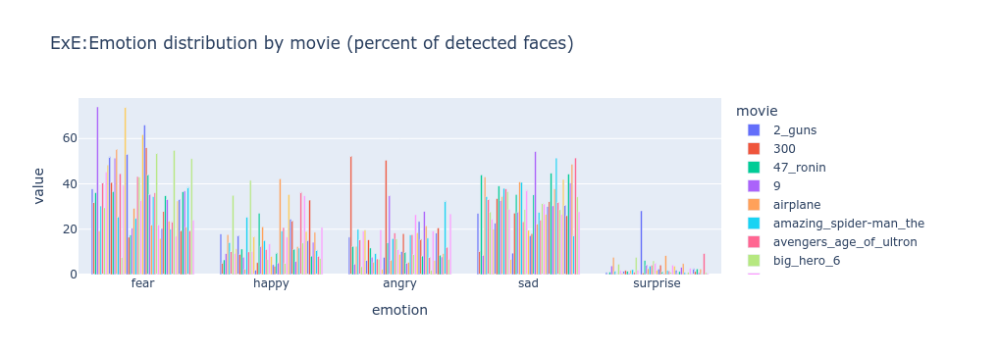

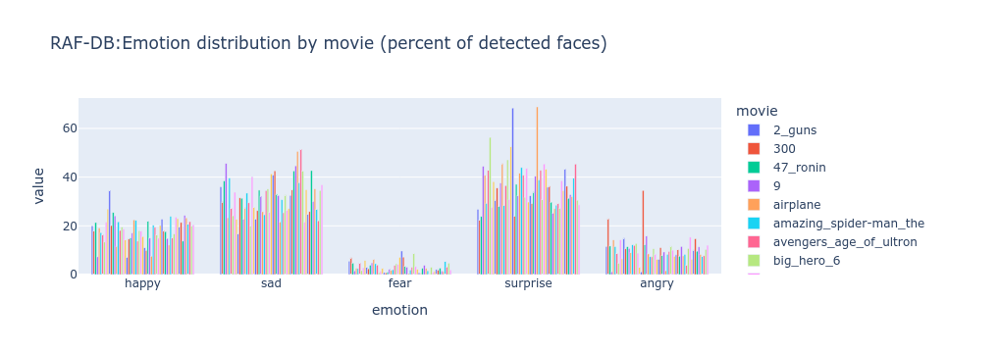

In [33]:
for model, tidy in tidy_dfs.items():
    emo_perc_by_movie(tidy, save_path=save_path, name=model)

In [34]:
def movie_by_emo_perc(tidy_df, save_path=None, name="Model"):
    fig = px.bar(
        tidy_df,
        x="movie",
        y=['percent'],
        color="emotion",
        color_discrete_map=EMOTION_COLORS,
        barmode="group",
        title=f"{name}: Emotion distribution by movie (percent of detected faces)"
    )
    if save_path:
        save_name = f"{name}_perc_movie_by_emo_bar.png"
        fig.write_image(save_path / save_name)
    fig.show()

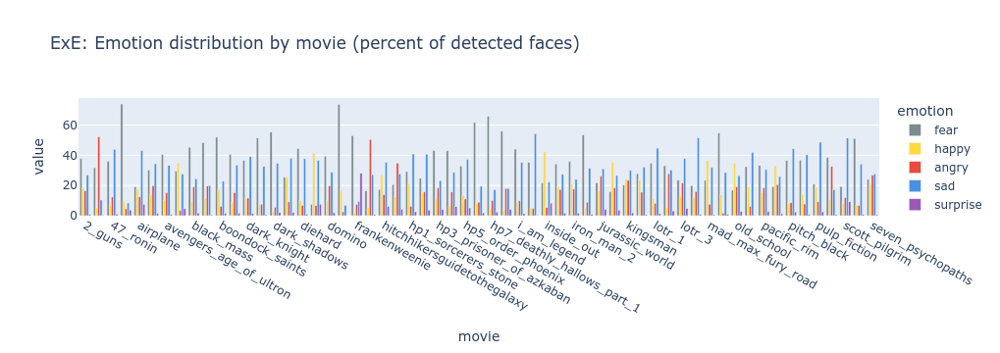

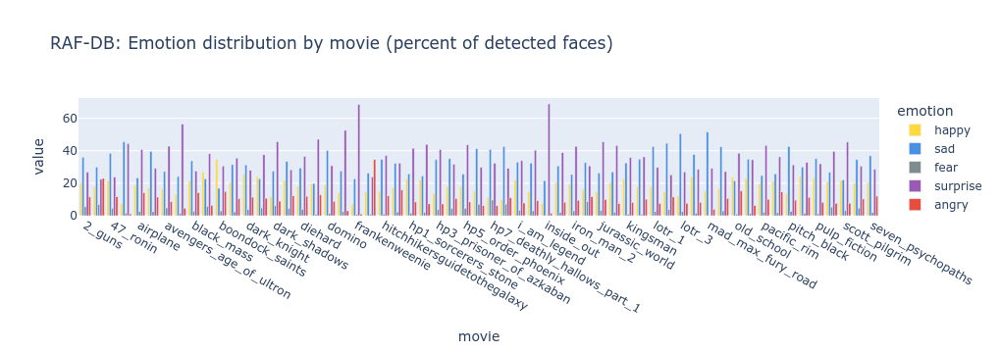

In [35]:
for model, tidy in tidy_dfs.items():
    movie_by_emo_perc(tidy, save_path=save_path, name=model)

In [36]:
def stacked_emo_perc_by_movie(tidy_df, save_path=None, name="Model"):
    fig = px.bar(
        tidy_df,
        x="movie",
        y="percent",
        color="emotion",
        color_discrete_map=EMOTION_COLORS,
        barmode="stack",
        title=f"{name}: Emotion Distribution by Movie (Stacked %)",
        height=600,
        category_orders={
            "emotion": ["angry", "fear", "happy", "sad", "surprise"]
        },
    )

    fig.update_xaxes(tickangle=45)
    fig.update_layout(
        legend=dict(
            orientation="h", yanchor="bottom", 
            y=.99, xanchor="center", x=0.5,
            bordercolor="#000000",
            borderwidth=2, 
        )
    )
    
    if save_path:
        save_name = f"{name}_stack_emo_by_movie.png"
        fig.write_image(save_path / save_name)
    fig.show()

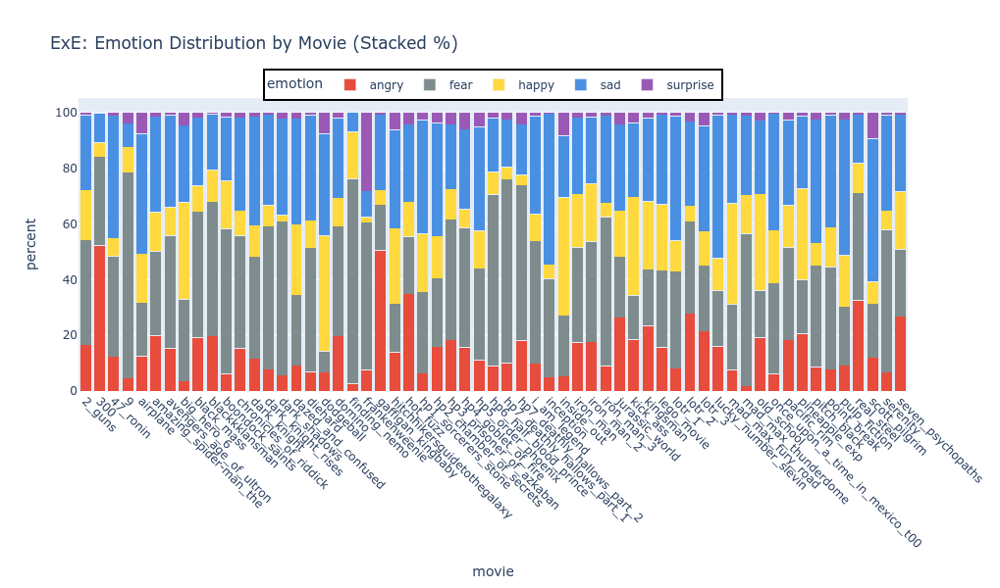

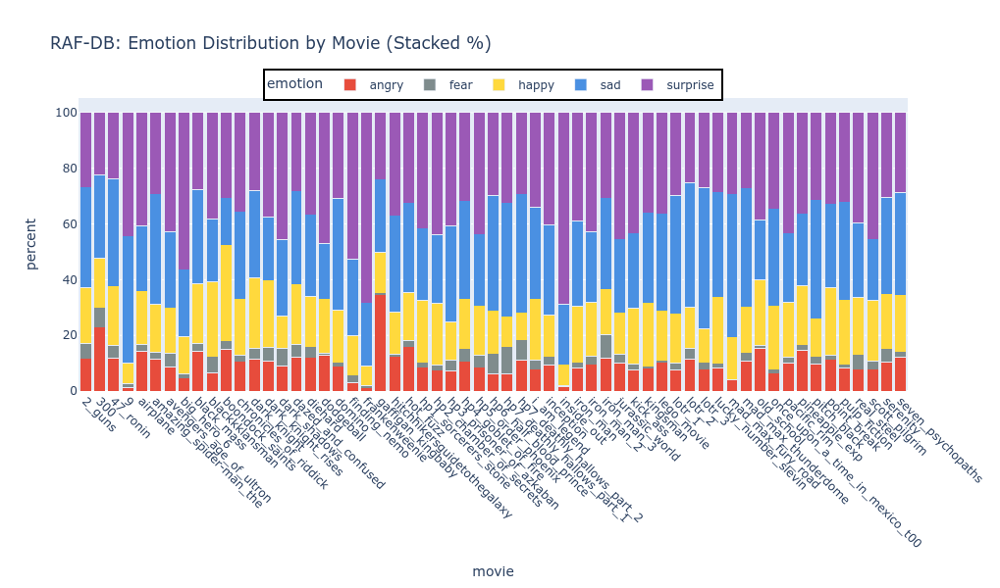

In [37]:
for model, tidy in tidy_dfs.items():
    stacked_emo_perc_by_movie(tidy, save_path=save_path, name=model)

In [38]:
comedies = [
    'airplane',
    'dark_shadows',
    'dazed_and_confused',
    'dodgeball',
    'gaffigan_kingbaby',
    'hitchhikersguidetothegalaxy',
    'hot_fuzz',
    'old_school',
    'pineapple_exp',
    'scott_pilgrim'
] 

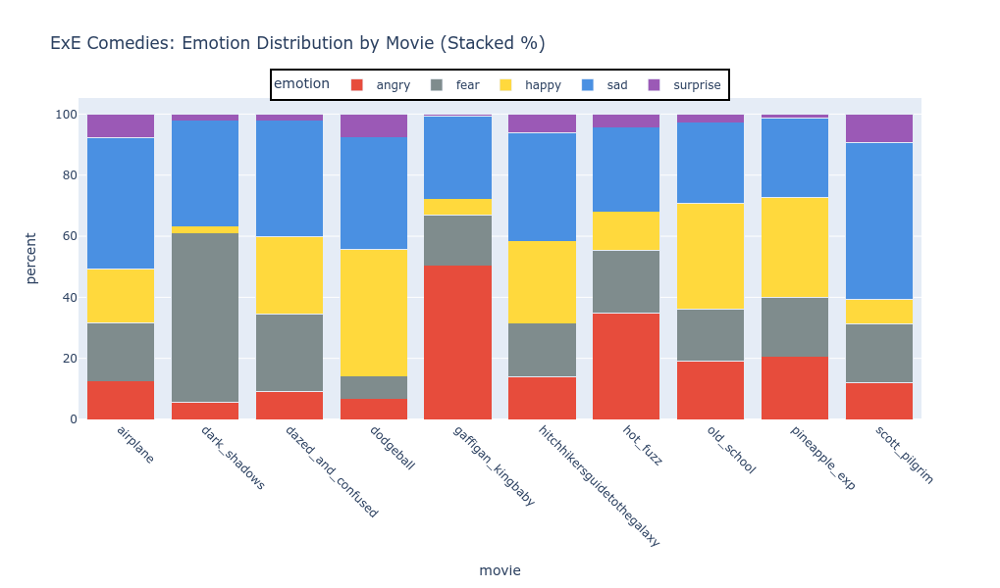

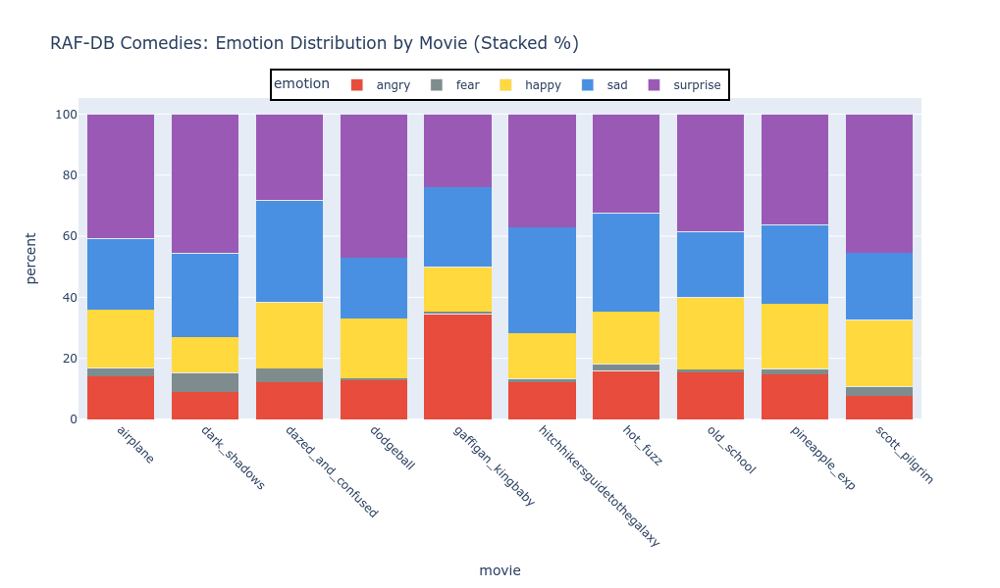

In [39]:
for model, tidy in tidy_dfs.items():
    com_df = tidy[tidy["movie"].isin(comedies)]
    stacked_emo_perc_by_movie(com_df, save_path=save_path, name=model+' Comedies')

In [40]:
def qa_visuals(df_dict, save_path=None):
    for name, df  in df_dict.items():
        pd_df = df.to_pandas()
        pd_df.sort_values(by=["movie"], inplace=True)

        fig = px.box(
            pd_df,
            x='emotion',
            y='confidence',
            title=f"{name}: Emotion Prediction Confidence by Class",
            color='emotion'
        )
        
        if save_path:
            save_name = f"{name}_pred_conf_by_emo.png"
            fig.write_image(save_path / save_name)
        fig.show()
        
        fig = px.box(
            pd_df,
            x='movie',
            y='relative_face_area',
            title=f"{name}: Face Size Distribution by Movie",
            log_y=True
        )
        if save_path:
            save_name = f"{name}_face_size_by_movie.png"
            fig.write_image(save_path / save_name)
        fig.show()

        fig = px.box(
            pd_df,
            x='emotion',
            y='relative_face_area',
            title=f'{name}: Face Size Distribution by Emotion',
            log_y=True 
        )
        
        if save_path:
            save_name = f"{name}_face_size_by_emotion.png"
            fig.write_image(save_path / save_name)
        fig.show()

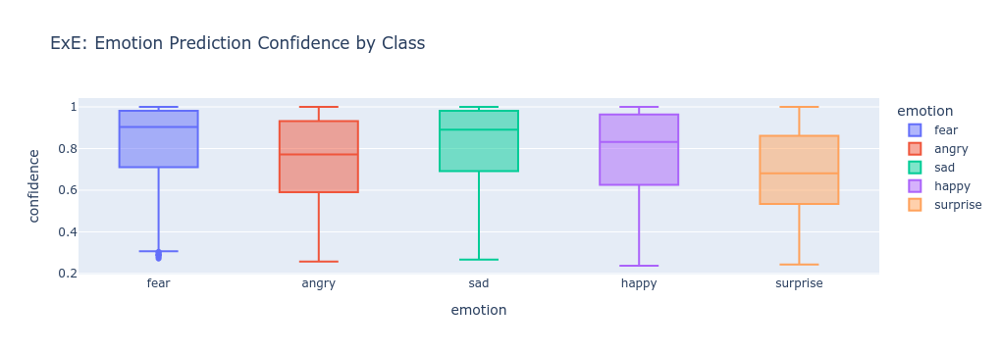

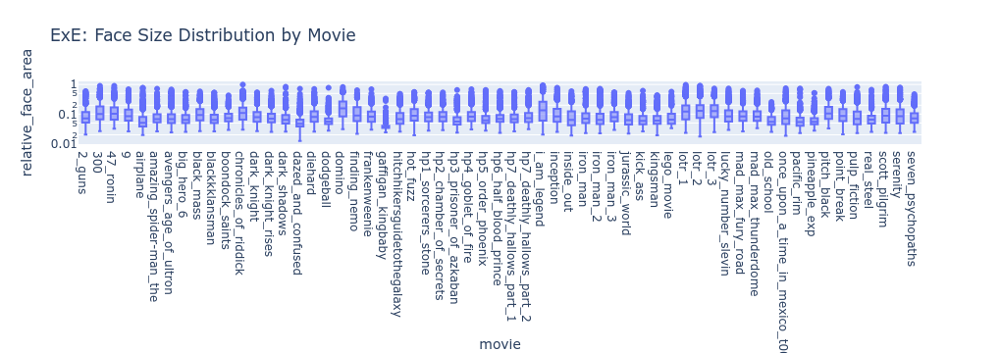

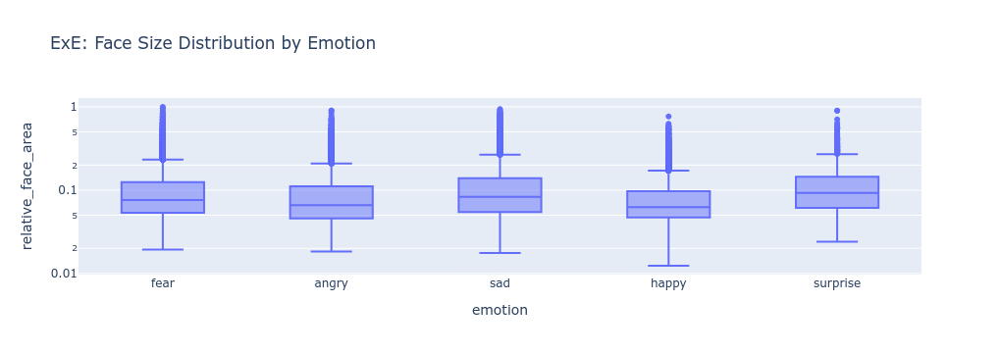

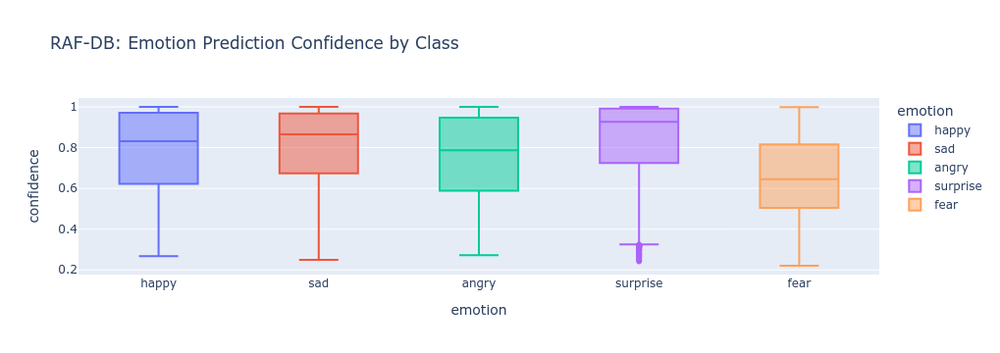

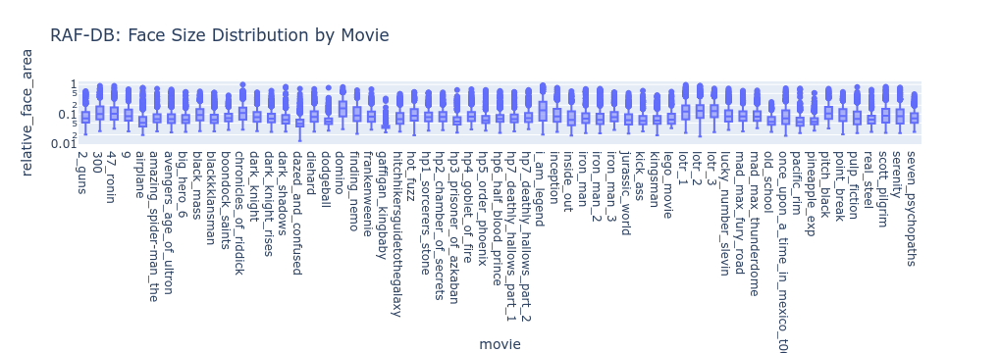

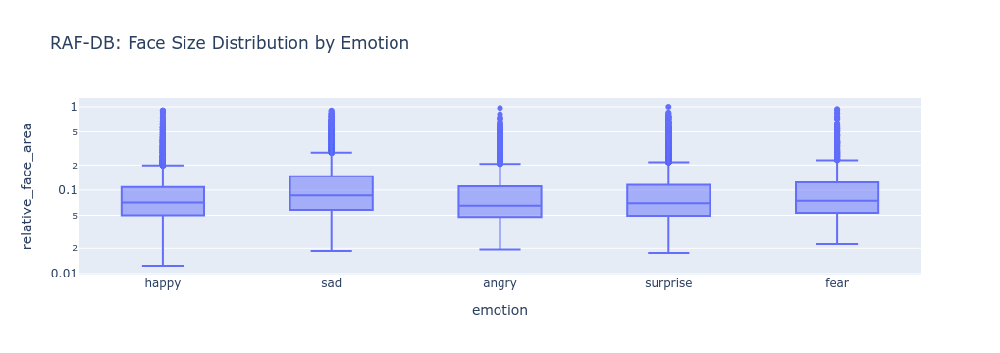

In [41]:
qa_visuals(movie_dfs, save_path=save_path)

## Movie Timeline Analysis

In [42]:
def plot_emotion_timeline(df, movie_name, confidence_threshold=0.5):
    """
    Plot cumulative emotion counts over movie runtime.
    """
    # Get movie data
    movie_df = (
        df
        .filter(pl.col("movie") == movie_name)
        .filter(pl.col("confidence") >= confidence_threshold)
        .sort("timestamp_sec")
    )
    
    if len(movie_df) == 0:
        print(f"No data for {movie_name}")
        return None
    
    # Create cumulative counts
    emotions = ["angry", "fear", "happy", "sad", "surprise"]
    
    # Initialize cumulative counters
    timeline_data = []
    cumulative = {e: 0 for e in emotions}
    
    for row in movie_df.iter_rows(named=True):
        # Increment the detected emotion
        cumulative[row["emotion"]] += 1
        
        # Record state at this timestamp
        timeline_data.append({
            "timestamp_sec": row["timestamp_sec"],
            "timestamp_min": row["timestamp_sec"] / 60,
            **{f"{e}_count": cumulative[e] for e in emotions}
        })
    
    timeline_df = pl.DataFrame(timeline_data)
    
    # Convert to pandas for plotly
    timeline_pd = timeline_df.to_pandas()
    
    # Create line plot
    fig = go.Figure()
    
    colors = {
        "angry": "#e74c3c",
        "fear": "#9b59b6", 
        "happy": "#f39c12",
        "sad": "#3498db",
        "surprise": "#1abc9c"
    }
    
    for emotion in emotions:
        fig.add_trace(go.Scatter(
            x=timeline_pd["timestamp_min"],
            y=timeline_pd[f"{emotion}_count"],
            mode="lines",
            name=emotion,
            line=dict(color=colors[emotion], width=2),
        ))
    
    fig.update_layout(
        title=f"Emotion Timeline: {movie_name} (confidence ≥ {confidence_threshold})",
        xaxis_title="Time (minutes)",
        yaxis_title="Cumulative Face Count",
        hovermode="x unified",
        height=500,
    )
    
    return fig

In [43]:
def timeline_multiple_models(df_dict, movie_title, save_path=None):
    for name, df in df_dict.items():
        print(name)
        fig = plot_emotion_timeline(df, movie_title, confidence_threshold=0.5)
        if save_path:
            out_name = save_path / f"{name}_timeplot_{movie_title}.png"    
            fig.write_image(out_name)
        fig.show()


In [44]:
all_titles = movie_dfs['RAF-DB']['movie'].unique().to_list()

In [45]:
all_titles.sort()
all_titles

['2_guns',
 '300',
 '47_ronin',
 '9',
 'airplane',
 'amazing_spider-man_the',
 'avengers_age_of_ultron',
 'big_hero_6',
 'black_mass',
 'blackkklansman',
 'boondock_saints',
 'chronicles_of_riddick',
 'dark_knight',
 'dark_knight_rises',
 'dark_shadows',
 'dazed_and_confused',
 'diehard',
 'dodgeball',
 'domino',
 'finding_nemo',
 'frankenweenie',
 'gaffigan_kingbaby',
 'hitchhikersguidetothegalaxy',
 'hot_fuzz',
 'hp1_sorcerers_stone',
 'hp2_chamber_of_secrets',
 'hp3_prisoner_of_azkaban',
 'hp4_goblet_of_fire',
 'hp5_order_phoenix',
 'hp6_half_blood_prince',
 'hp7_deathly_hallows_part_1',
 'hp7_deathly_hallows_part_2',
 'i_am_legend',
 'inception',
 'inside_out',
 'iron_man',
 'iron_man_2',
 'iron_man_3',
 'jurassic_world',
 'kick_ass',
 'kingsman',
 'lego_movie',
 'lotr_1',
 'lotr_2',
 'lotr_3',
 'lucky_number_slevin',
 'mad_max_fury_road',
 'mad_max_thunderdome',
 'old_school',
 'once_upon_a_time_in_mexico_t00',
 'pacific_rim',
 'pineapple_exp',
 'pitch_black',
 'point_break',
 'pu

ExE


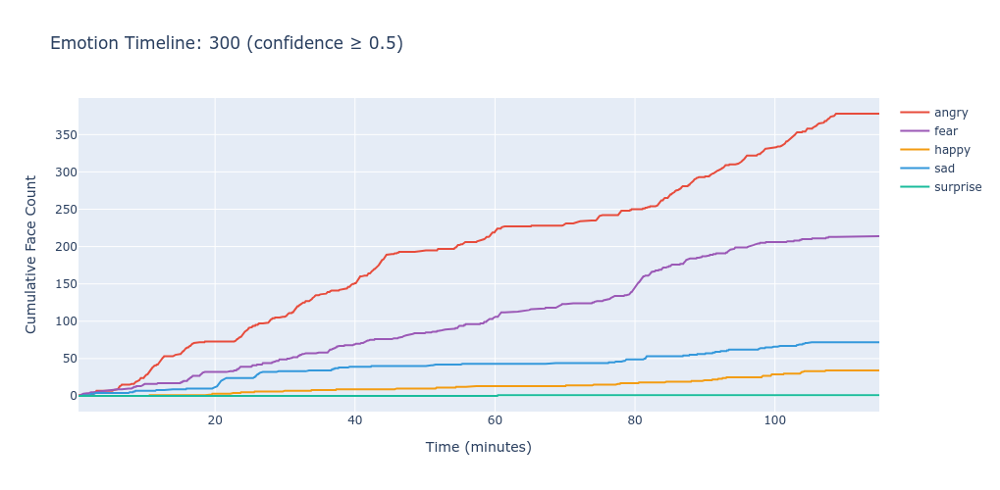

RAF-DB


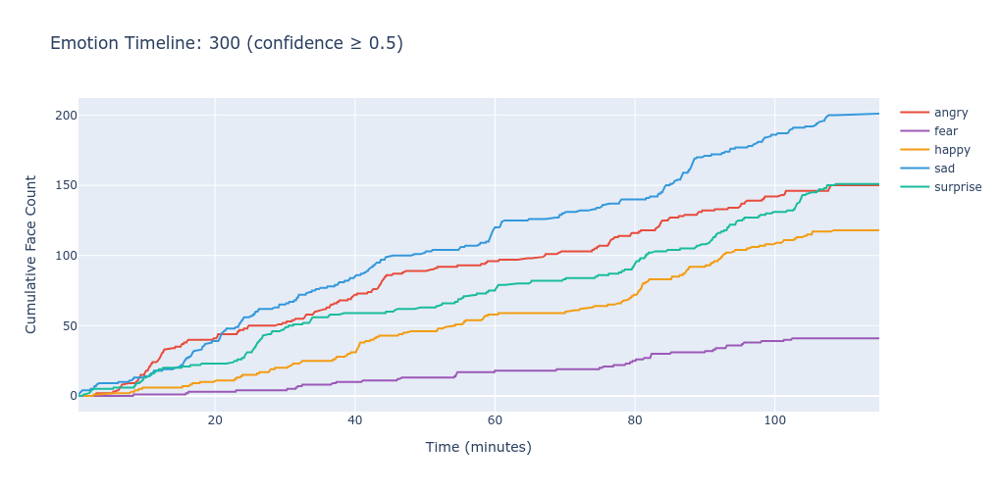

In [46]:
timeline_multiple_models(movie_dfs, "300", save_path=save_path)

ExE


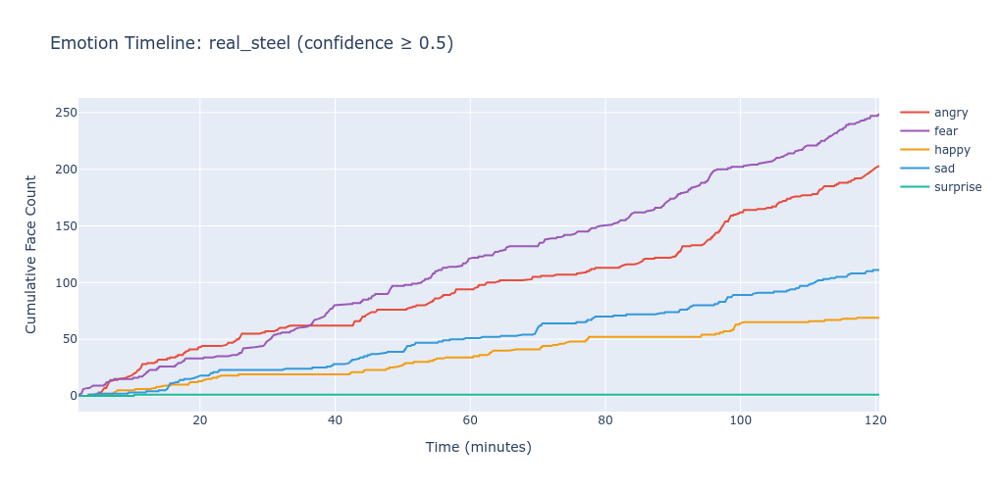

RAF-DB


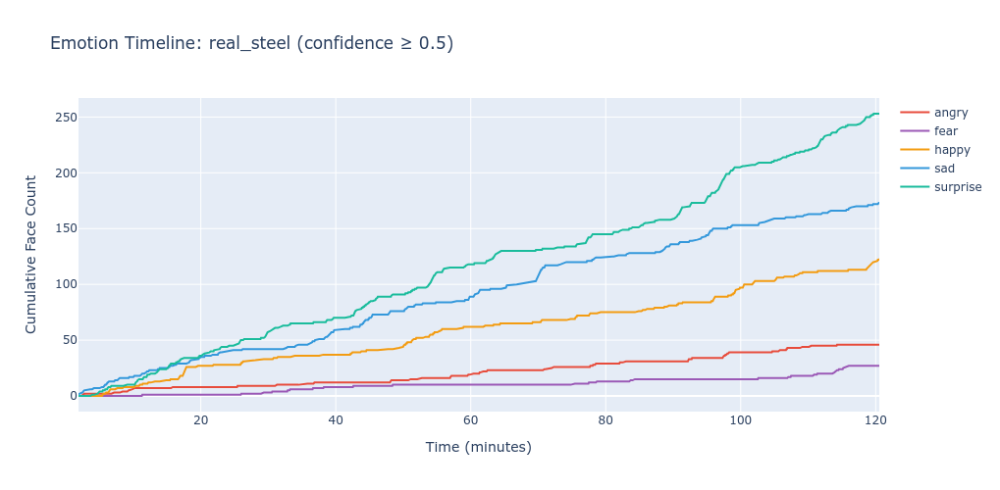

In [47]:
timeline_multiple_models(movie_dfs, "real_steel", save_path=save_path)

ExE


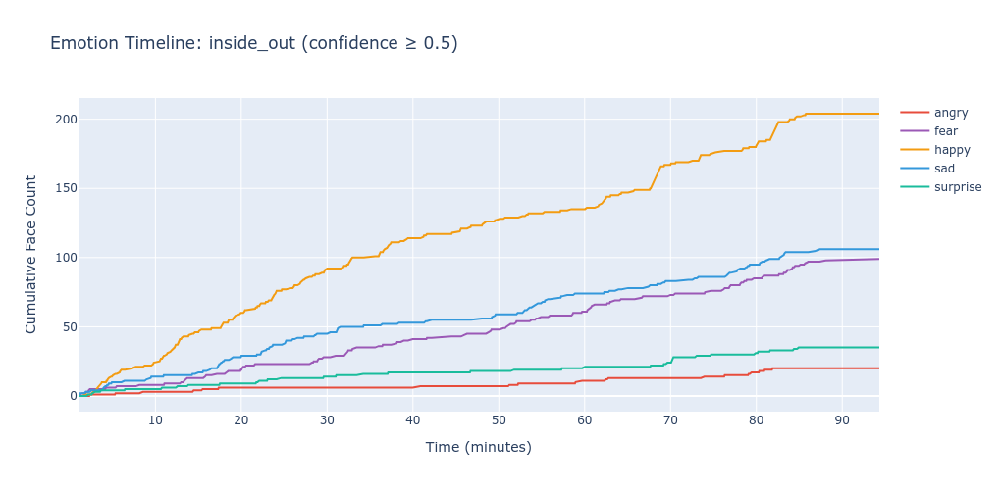

RAF-DB


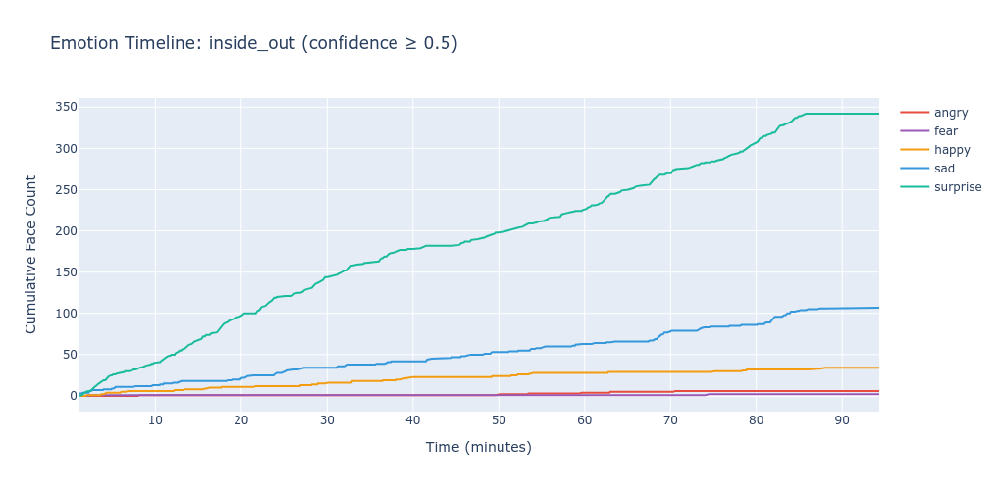

In [48]:
timeline_multiple_models(movie_dfs, "inside_out", save_path=save_path)

ExE


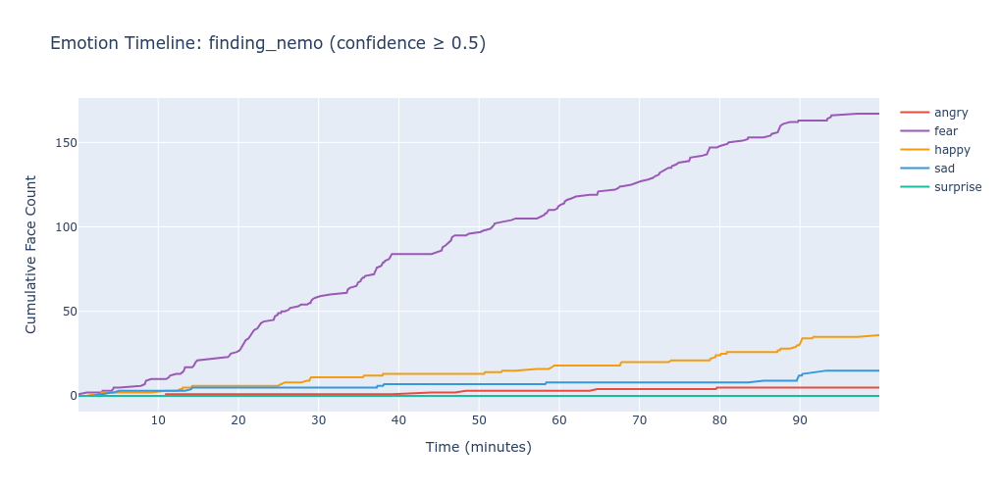

RAF-DB


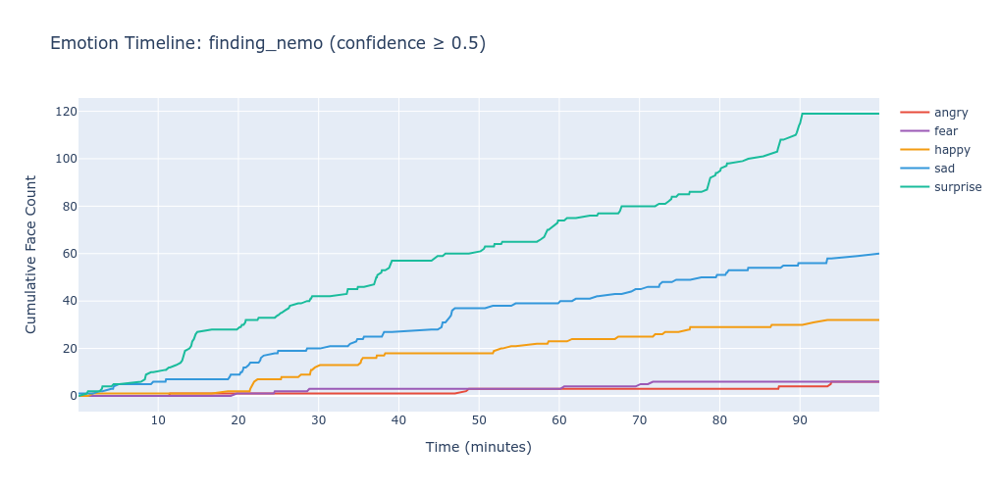

In [49]:
timeline_multiple_models(movie_dfs, "finding_nemo", save_path=save_path)